# Exploratory Data Analysis Notebook

### Author: Will Sanzone
### Email: wsanzoneds@gmail.com

## Introduction

In this notebook we will be doing the following:

- Merging the dataframes created in the `NYC_data_cleaner` notebook
- Removing duplicate listings
- Performing EDA

### Please Note: This notebook will only run with the `cleaning_and_eda_env` environment up and running. Please make sure that you have this environment installed before running the notebook.

First we will import the relevant libraries

In [1]:
# Three libraries always included
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Extra libraries
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import os
import geopandas as gpd
from shapely.geometry import Point, Polygon
os.environ["KMP_DUPLICATE_LIB_OK"]="TRUE"

/Users/williamsanzone/opt/anaconda3/envs/plotly_bokeh/lib/python3.8/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.1
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


Now we can read in all the clean csv files from our data cleaning notebook

In [2]:
dec2021 = pd.read_csv('clean_data/nyc_dec2021_clean.csv')
sept2021 = pd.read_csv('clean_data/nyc_sept2021_clean.csv')
march2022 = pd.read_csv('clean_data/nyc_march2022_clean.csv')
june2022 = pd.read_csv('clean_data/nyc_june2022_clean.csv')

Checking the shape of each dataframe.

In [3]:
dec2021.shape

(26211, 57)

In [4]:
sept2021.shape

(26175, 57)

In [5]:
march2022.shape

(26953, 57)

In [6]:
june2022.shape

(27900, 57)

Checking to make sure that they have the same columns.

In [7]:
# Creating a list to loop over
dataframes = [dec2021, sept2021, march2022, june2022]

In [8]:
# Checking to make sure that the dataframes have the same number of columns, and that the columns have the same names
all([len(dataframes[0].columns.intersection(df.columns)) 
      == dataframes[0].shape[1] for df in dataframes])

True

Ok, all of these dataframes have the same number of columns, and have the same columns throughout them. Let's join them together.

In [9]:
# Combining each dataframe on their rows with an outer join
listings = pd.concat(dataframes, axis=0, join='outer', ignore_index=True)

In [10]:
listings.shape

(107239, 57)

In [11]:
dec2021.shape[0] + sept2021.shape[0] + march2022.shape[0] + june2022.shape[0] == listings.shape[0]

True

We will want to see all columns when displaying our dataframes. We can use the `set_option` to do this:

In [12]:
pd.set_option('display.max_columns', None)

Let's take a look at our compiled dataframe:

In [13]:
listings.head(3)

,Unnamed: 0,id,listing_url,last_scraped,name,description,neighborhood_description,picture_url,host_id,host_url,host_name,host_since,host_location,host_response_rate,host_acceptance_rate,host_is_superhost,host_neighbourhood,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,neighborhood,neighborhood_group,latitude,longitude,property_type,room_type,accommodates,num_bathrooms,bedrooms,beds,amenities,price,minimum_nights,maximum_nights,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,calculated_host_listings_count,reviews_per_month,host_has_bio
0,0,2595,https://www.airbnb.com/rooms/2595,2021-12-05,Skylit Midtown Castle,"Beautiful, spacious skylit studio in the heart...",Centrally located in the heart of Manhattan ju...,https://a0.muscache.com/pictures/f0813a11-40b2...,2845,https://www.airbnb.com/users/show/2845,Jennifer,2008-09-09,"New York, New York, United States",0.80,0.17,0.0,Midtown,8.0,"['email', 'phone', 'reviews', 'offline_governm...",1.0,1.0,Midtown,Manhattan,40.75356,-73.98559,Entire rental unit,Entire home/apt,1,1.0,1.0,1.0,"[""Extra pillows and blankets"", ""Baking sheet"",...",150.0,30,1125,1,3,33,63,338,2021-12-05,48,0,0,2009-11-21,2019-11-04,4.70,4.72,4.62,4.76,4.79,4.86,4.41,0,3,0.33,1
1,1,3831,https://www.airbnb.com/rooms/3831,2021-12-05,"Whole flr w/private bdrm, bath & kitchen(pls r...","Enjoy 500 s.f. top floor in 1899 brownstone, w...",Just the right mix of urban center and local n...,https://a0.muscache.com/pictures/e49999c2-9fd5...,4869,https://www.airbnb.com/users/show/4869,LisaRoxanne,2008-12-07,"New York, New York, United States",0.09,0.69,0.0,Clinton Hill,1.0,"['email', 'phone', 'reviews', 'offline_governm...",1.0,1.0,Bedford-Stuyvesant,Brooklyn,40.68494,-73.95765,Entire guest suite,Entire home/apt,3,1.0,1.0,3.0,"[""Extra pillows and blankets"", ""Luggage dropof...",75.0,1,730,1,3,6,18,194,2021-12-05,409,32,0,2015-01-05,2021-10-22,4.45,4.58,4.49,4.78,4.80,4.71,4.64,0,1,4.86,1
2,2,5121,https://www.airbnb.com/rooms/5121,2021-12-05,BlissArtsSpace!,<b>The space</b><br />HELLO EVERYONE AND THANK...,none,https://a0.muscache.com/pictures/2090980c-b68e...,7356,https://www.airbnb.com/users/show/7356,Garon,2009-02-03,"New York, New York, United States",1.00,1.00,0.0,Bedford-Stuyvesant,1.0,"['email', 'phone', 'facebook', 'reviews', 'off...",1.0,1.0,Bedford-Stuyvesant,Brooklyn,40.68535,-73.95512,Private room in rental unit,Private room,2,1.0,1.0,1.0,"[""Kitchen"", ""Long term stays allowed"", ""Wifi"",...",60.0,30,730,1,30,60,90,365,2021-12-05,50,0,0,2014-01-22,2016-06-05,4.52,4.22,4.09,4.91,4.91,4.47,4.52,0,2,0.52,1


We had a weird column in the dataframe, so let's get rid of it.

In [14]:
listings.drop(columns='Unnamed: 0', inplace=True) # removing the column
listings.head(3)

,id,listing_url,last_scraped,name,description,neighborhood_description,picture_url,host_id,host_url,host_name,host_since,host_location,host_response_rate,host_acceptance_rate,host_is_superhost,host_neighbourhood,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,neighborhood,neighborhood_group,latitude,longitude,property_type,room_type,accommodates,num_bathrooms,bedrooms,beds,amenities,price,minimum_nights,maximum_nights,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,calculated_host_listings_count,reviews_per_month,host_has_bio
0,2595,https://www.airbnb.com/rooms/2595,2021-12-05,Skylit Midtown Castle,"Beautiful, spacious skylit studio in the heart...",Centrally located in the heart of Manhattan ju...,https://a0.muscache.com/pictures/f0813a11-40b2...,2845,https://www.airbnb.com/users/show/2845,Jennifer,2008-09-09,"New York, New York, United States",0.80,0.17,0.0,Midtown,8.0,"['email', 'phone', 'reviews', 'offline_governm...",1.0,1.0,Midtown,Manhattan,40.75356,-73.98559,Entire rental unit,Entire home/apt,1,1.0,1.0,1.0,"[""Extra pillows and blankets"", ""Baking sheet"",...",150.0,30,1125,1,3,33,63,338,2021-12-05,48,0,0,2009-11-21,2019-11-04,4.70,4.72,4.62,4.76,4.79,4.86,4.41,0,3,0.33,1
1,3831,https://www.airbnb.com/rooms/3831,2021-12-05,"Whole flr w/private bdrm, bath & kitchen(pls r...","Enjoy 500 s.f. top floor in 1899 brownstone, w...",Just the right mix of urban center and local n...,https://a0.muscache.com/pictures/e49999c2-9fd5...,4869,https://www.airbnb.com/users/show/4869,LisaRoxanne,2008-12-07,"New York, New York, United States",0.09,0.69,0.0,Clinton Hill,1.0,"['email', 'phone', 'reviews', 'offline_governm...",1.0,1.0,Bedford-Stuyvesant,Brooklyn,40.68494,-73.95765,Entire guest suite,Entire home/apt,3,1.0,1.0,3.0,"[""Extra pillows and blankets"", ""Luggage dropof...",75.0,1,730,1,3,6,18,194,2021-12-05,409,32,0,2015-01-05,2021-10-22,4.45,4.58,4.49,4.78,4.80,4.71,4.64,0,1,4.86,1
2,5121,https://www.airbnb.com/rooms/5121,2021-12-05,BlissArtsSpace!,<b>The space</b><br />HELLO EVERYONE AND THANK...,none,https://a0.muscache.com/pictures/2090980c-b68e...,7356,https://www.airbnb.com/users/show/7356,Garon,2009-02-03,"New York, New York, United States",1.00,1.00,0.0,Bedford-Stuyvesant,1.0,"['email', 'phone', 'facebook', 'reviews', 'off...",1.0,1.0,Bedford-Stuyvesant,Brooklyn,40.68535,-73.95512,Private room in rental unit,Private room,2,1.0,1.0,1.0,"[""Kitchen"", ""Long term stays allowed"", ""Wifi"",...",60.0,30,730,1,30,60,90,365,2021-12-05,50,0,0,2014-01-22,2016-06-05,4.52,4.22,4.09,4.91,4.91,4.47,4.52,0,2,0.52,1


In [15]:
listings.isna().sum() # Re checking for nulls

id                                0
listing_url                       0
last_scraped                      0
name                              0
description                       0
neighborhood_description          0
picture_url                       0
host_id                           0
host_url                          0
host_name                         0
host_since                        0
host_location                     0
host_response_rate                0
host_acceptance_rate              0
host_is_superhost                 0
host_neighbourhood                0
host_total_listings_count         0
host_verifications                0
host_has_profile_pic              0
host_identity_verified            0
neighborhood                      0
neighborhood_group                0
latitude                          0
longitude                         0
property_type                     0
room_type                         0
accommodates                      0
num_bathrooms               

Now let's see how many duplicates exist in the dataset.

In [16]:
listings.duplicated().sum()

0

This doesn't tell us much because the `duplicated` method checks if every value in a row matches. Since we have a `last_scraped` column, the same listing by the same host will not be a full match to other listings from previous scrape dates. We can use the `subset` attribute to find the actual duplicates.

In [17]:
# Sorting our duplicates first by id and then by listing_url
listings[listings.duplicated(subset = ['id', 'listing_url'])].sort_values(by='id')

,id,listing_url,last_scraped,name,description,neighborhood_description,picture_url,host_id,host_url,host_name,host_since,host_location,host_response_rate,host_acceptance_rate,host_is_superhost,host_neighbourhood,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,neighborhood,neighborhood_group,latitude,longitude,property_type,room_type,accommodates,num_bathrooms,bedrooms,beds,amenities,price,minimum_nights,maximum_nights,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,calculated_host_listings_count,reviews_per_month,host_has_bio
26211,2595,https://www.airbnb.com/rooms/2595,2021-09-02,Skylit Midtown Castle,"Beautiful, spacious skylit studio in the heart...",Centrally located in the heart of Manhattan ju...,https://a0.muscache.com/pictures/f0813a11-40b2...,2845,https://www.airbnb.com/users/show/2845,Jennifer,2008-09-09,"New York, New York, United States",0.34,0.190000,0.0,Midtown,6.0,"['email', 'phone', 'reviews', 'offline_governm...",1.0,1.0,Midtown,Manhattan,40.75356,-73.98559,Entire rental unit,Entire home/apt,1,1.0,1.0,1.0,"[""Free street parking"", ""Heating"", ""TV"", ""Dedi...",150.0,30,1125,1,5,35,65,340,2021-09-02,48,0,0,2009-11-21,2019-11-04,4.70,4.72,4.62,4.76,4.79,4.86,4.41,0,3,0.33,1
52386,2595,https://www.airbnb.com/rooms/2595,2022-03-05,Skylit Midtown Castle,"Beautiful, spacious skylit studio in the heart...",Centrally located in the heart of Manhattan ju...,https://a0.muscache.com/pictures/f0813a11-40b2...,2845,https://www.airbnb.com/users/show/2845,Jennifer,2008-09-09,"New York, New York, United States",0.44,0.180000,0.0,Midtown,5.0,"['email', 'phone', 'reviews', 'offline_governm...",1.0,1.0,Midtown,Manhattan,40.75356,-73.98559,Entire rental unit,Entire home/apt,1,1.0,1.0,1.0,"[""Bathtub"", ""Dishes and silverware"", ""Air cond...",150.0,30,1125,1,30,60,77,334,2022-03-05,48,0,0,2009-11-21,2019-11-04,4.70,4.72,4.62,4.76,4.79,4.86,4.41,0,3,0.32,1
79339,2595,https://www.airbnb.com/rooms/2595,2022-06-04,Skylit Midtown Castle,"Beautiful, spacious skylit studio in the heart...",Centrally located in the heart of Manhattan ju...,https://a0.muscache.com/pictures/f0813a11-40b2...,2845,https://www.airbnb.com/users/show/2845,Jennifer,2008-09-09,"New York, New York, United States",0.39,0.190000,0.0,Midtown,6.0,"['email', 'phone', 'work_email']",1.0,1.0,Midtown,Manhattan,40.75356,-73.98559,Entire rental unit,Entire home/apt,1,1.0,1.0,1.0,"[""Essentials"", ""Bathtub"", ""Extra pillows and b...",225.0,30,1125,1,0,3,33,308,2022-06-04,48,0,0,2009-11-21,2019-11-04,4.70,4.72,4.62,4.76,4.79,4.86,4.41,0,3,0.31,1
26212,3831,https://www.airbnb.com/rooms/3831,2021-09-02,"Whole flr w/private bdrm, bath & kitchen(pls r...","Enjoy 500 s.f. top floor in 1899 brownstone, w...",Just the right mix of urban center and local n...,https://a0.muscache.com/pictures/e49999c2-9fd5...,4869,https://www.airbnb.com/users/show/4869,LisaRoxanne,2008-12-07,"New York, New York, United States",0.50,0.860000,0.0,Clinton Hill,1.0,"['email', 'phone', 'reviews', 'offline_governm...",1.0,1.0,Bedford-Stuyvesant,Brooklyn,40.68494,-73.95765,Entire guest suite,Entire home/apt,3,1.0,1.0,3.0,"[""Dedicated workspace"", ""Iron"", ""Stove"", ""Hair...",76.0,1,730,1,0,4,9,208,2021-09-02,408,58,0,2015-01-05,2021-06-29,4.46,4.59,4.50,4.79,4.81,4.72,4.65,0,1,5.03,1
26213,5121,https://www.airbnb.com/rooms/5121,2021-09-02,BlissArtsSpace!,<b>The space</b><br />HELLO EVERYONE AND THANK...,none,https://a0.muscache.com/pictures/2090980c-b68e...,7356,https://www.airbnb.com/users/show/7356,Garon,2009-02-03,"New York, New York, United States",1.00,0.758428,0.0,Bedford-Stuyvesant,1.0,"['email', 'phone', 'facebook', 'reviews', 'off.

Let's see how many duplicates we actually have.

In [18]:
# Getting a count of all the duplicates
len(listings[listings.duplicated(subset = ['id', 'listing_url'])].sort_values(by='id'))

71421

We will only want the most recent listing data. Older listings will not have the most updated prices and will likely not have as many reviews as the most recent listings. We can use the pandas method `sort_values` to get these in order, first by the `id` and then by the `last_scraped` date.

In [19]:
# Sorting our values by id and the date they were last scraped
listings = listings.sort_values(by=['id', 'last_scraped'], ascending=False)
listings

,id,listing_url,last_scraped,name,description,neighborhood_description,picture_url,host_id,host_url,host_name,host_since,host_location,host_response_rate,host_acceptance_rate,host_is_superhost,host_neighbourhood,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,neighborhood,neighborhood_group,latitude,longitude,property_type,room_type,accommodates,num_bathrooms,bedrooms,beds,amenities,price,minimum_nights,maximum_nights,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,calculated_host_listings_count,reviews_per_month,host_has_bio
107238,639177088317762843,https://www.airbnb.com/rooms/639177088317762843,2022-06-04,.NEW ROOM - 1 STOP FROM MANHATTAN!!,Your family will be close to everything when y...,none,https://a0.muscache.com/pictures/47eb3809-cc08...,10932488,https://www.airbnb.com/users/show/10932488,Mauricio,2013-12-31,"New York, New York, United States",1.00,0.84,1.0,Long Island City,0.0,"['email', 'phone']",1.0,1.0,Long Island City,Queens,40.748440,-73.948685,Private room in rental unit,Private room,2,1.0,1.0,2.0,"[""Essentials"", ""Bathtub"", ""Portable fans"", ""Ex...",160.0,1,10,1,11,28,56,331,2022-06-04,1,1,1,2022-06-02,2022-06-02,5.00,5.00,5.00,5.00,5.00,5.00,5.00,0,6,1.00,1
107237,638474663573735856,https://www.airbnb.com/rooms/638474663573735856,2022-06-04,Spacious private room and bathroom in New York,"A private master room in a cozy and spacious, ...","We are located in the lively Bleecker street, ...",https://a0.muscache.com/pictures/miso/Hosting-...,15187068,https://www.airbnb.com/users/show/15187068,Sara,2014-05-06,"New York, New York, United States",0.90,0.86,0.0,Bushwick,5.0,"['email', 'phone']",1.0,1.0,Bushwick,Brooklyn,40.698909,-73.918639,Private room in rental unit,Private room,2,1.0,1.0,1.0,"[""Wine glasses"", ""Conditioner"", ""Essentials"", ...",170.0,1,1125,1,17,45,45,45,2022-06-04,1,1,1,2022-06-02,2022-06-02,5.00,5.00,5.00,5.00,5.00,5.00,5.00,1,3,1.00,0
107236,637585491442944314,https://www.airbnb.com/rooms/637585491442944314,2022-06-04,Lovely & xtra large quiet bedroom in Prime Ast...,This extra large private bedroom is less than ...,none,https://a0.muscache.com/pictures/miso/Hosting-...,459709498,https://www.airbnb.com/users/show/459709498,Justin,2022-05-18,US,0.83,0.80,0.0,Long Island City,0.0,"['email', 'phone', 'work_email']",1.0,1.0,Long Island City,Queens,40.748006,-73.943495,Private room in serviced apartment,Private room,2,1.0,1.0,1.0,"[""Dryer"", ""Heating"", ""TV"", ""Smoke alarm"", ""Was...",74.0,1,5,1,1,1,1,35,2022-06-04,1,1,1,2022-06-02,2022-06-02,5.00,5.00,5.00,5.00,5.00,5.00,5.00,1,1,1.00,0
107235,635531827756587824,https://www.airbnb.com/rooms/635531827756587824,2022-06-04,DHNY RESIDENCE,Make some memories at this unique and family-f...,Very diverse community<br />Deli/ supermarket/...,https://a0.muscache.com/pictures/miso/Hosting-...,398633876,https://www.airbnb.com/users/show/398633876,Shadath,2021-04-25,"Queens, New York, United States",1.00,1.00,0.0,Jamaica,0.0,"['email', 'phone']",1.0,1.0,St. Albans,Queens,40.701603,-73.765610,Entire serviced apartment,Entire home/apt,6,1.0,3.0,3.0,"[""Conditioner"", ""Essentials"", ""Trash compactor...",189.0,1,365,1,11,41,71,346,2022-06-04,1,1,1,2022-05-30,2022-05-30,5.00,5.00,5.00,5.00,5.00,5.00,5.00,1,1,1.00,0
107234,635494783850320801,https://www.airbnb.com/rooms/635494783850320801,2022-06-03,Central Lovely 1-bedroom condo,You are close to everything when you stay at t...,none,https://a0.muscache.com/pictures/miso/Hosting-...,384295125,https://www.airbnb.com/users/show/384295125,Melissa,2021-01-12,"Austin, Texas, United States",0.92,0.52,0.0,Midtown,2.0,"['email', 'phone']",0.0,1.0,Mid

Now we can drop our duplicates keeping the first (most recent) instance of each listing.

In [20]:
# Dropping our duplicates but keeping the most recent value
listings.drop_duplicates(subset='id', keep='first', inplace=True)

# Showing our modified dataframe
listings.head(5)

,id,listing_url,last_scraped,name,description,neighborhood_description,picture_url,host_id,host_url,host_name,host_since,host_location,host_response_rate,host_acceptance_rate,host_is_superhost,host_neighbourhood,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,neighborhood,neighborhood_group,latitude,longitude,property_type,room_type,accommodates,num_bathrooms,bedrooms,beds,amenities,price,minimum_nights,maximum_nights,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,calculated_host_listings_count,reviews_per_month,host_has_bio
107238,639177088317762843,https://www.airbnb.com/rooms/639177088317762843,2022-06-04,.NEW ROOM - 1 STOP FROM MANHATTAN!!,Your family will be close to everything when y...,none,https://a0.muscache.com/pictures/47eb3809-cc08...,10932488,https://www.airbnb.com/users/show/10932488,Mauricio,2013-12-31,"New York, New York, United States",1.00,0.84,1.0,Long Island City,0.0,"['email', 'phone']",1.0,1.0,Long Island City,Queens,40.748440,-73.948685,Private room in rental unit,Private room,2,1.0,1.0,2.0,"[""Essentials"", ""Bathtub"", ""Portable fans"", ""Ex...",160.0,1,10,1,11,28,56,331,2022-06-04,1,1,1,2022-06-02,2022-06-02,5.0,5.0,5.0,5.0,5.0,5.0,5.0,0,6,1.0,1
107237,638474663573735856,https://www.airbnb.com/rooms/638474663573735856,2022-06-04,Spacious private room and bathroom in New York,"A private master room in a cozy and spacious, ...","We are located in the lively Bleecker street, ...",https://a0.muscache.com/pictures/miso/Hosting-...,15187068,https://www.airbnb.com/users/show/15187068,Sara,2014-05-06,"New York, New York, United States",0.90,0.86,0.0,Bushwick,5.0,"['email', 'phone']",1.0,1.0,Bushwick,Brooklyn,40.698909,-73.918639,Private room in rental unit,Private room,2,1.0,1.0,1.0,"[""Wine glasses"", ""Conditioner"", ""Essentials"", ...",170.0,1,1125,1,17,45,45,45,2022-06-04,1,1,1,2022-06-02,2022-06-02,5.0,5.0,5.0,5.0,5.0,5.0,5.0,1,3,1.0,0
107236,637585491442944314,https://www.airbnb.com/rooms/637585491442944314,2022-06-04,Lovely & xtra large quiet bedroom in Prime Ast...,This extra large private bedroom is less than ...,none,https://a0.muscache.com/pictures/miso/Hosting-...,459709498,https://www.airbnb.com/users/show/459709498,Justin,2022-05-18,US,0.83,0.80,0.0,Long Island City,0.0,"['email', 'phone', 'work_email']",1.0,1.0,Long Island City,Queens,40.748006,-73.943495,Private room in serviced apartment,Private room,2,1.0,1.0,1.0,"[""Dryer"", ""Heating"", ""TV"", ""Smoke alarm"", ""Was...",74.0,1,5,1,1,1,1,35,2022-06-04,1,1,1,2022-06-02,2022-06-02,5.0,5.0,5.0,5.0,5.0,5.0,5.0,1,1,1.0,0
107235,635531827756587824,https://www.airbnb.com/rooms/635531827756587824,2022-06-04,DHNY RESIDENCE,Make some memories at this unique and family-f...,Very diverse community<br />Deli/ supermarket/...,https://a0.muscache.com/pictures/miso/Hosting-...,398633876,https://www.airbnb.com/users/show/398633876,Shadath,2021-04-25,"Queens, New York, United States",1.00,1.00,0.0,Jamaica,0.0,"['email', 'phone']",1.0,1.0,St. Albans,Queens,40.701603,-73.765610,Entire serviced apartment,Entire home/apt,6,1.0,3.0,3.0,"[""Conditioner"", ""Essentials"", ""Trash compactor...",189.0,1,365,1,11,41,71,346,2022-06-04,1,1,1,2022-05-30,2022-05-30,5.0,5.0,5.0,5.0,5.0,5.0,5.0,1,1,1.0,0
107234,635494783850320801,https://www.airbnb.com/rooms/635494783850320801,2022-06-03,Central Lovely 1-bedroom condo,You are close to everything when you stay at t...,none,https://a0.muscache.com/pictures/miso/Hosting-...,384295125,https://www.airbnb.com/users/show/384295125,Melissa,2021-01-12,"Austin, Texas, United States",0.92,0.52,0.0,Midtown,2.0,"['email', 'phone']",0.0,1.0,Midtown,Manhattan,40.765827,-73.982

Let's look at the shape of our refined DataFrame.

In [21]:
listings.shape # returns number of rows and columns for the dataset

(35818, 56)

Also as a sanity check, let's see how many duplicates we have based on the `id` column:

In [22]:
listings.duplicated(subset='id').sum() # re-checking for duplicate id's

0

We can drop the following columns:
- `picture_url`
- `host_url`

These columns don't really give us any important information.

In [23]:
# removing the columns
listings.drop(columns=['picture_url', 'host_url'], inplace=True)
listings.head(3)

,id,listing_url,last_scraped,name,description,neighborhood_description,host_id,host_name,host_since,host_location,host_response_rate,host_acceptance_rate,host_is_superhost,host_neighbourhood,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,neighborhood,neighborhood_group,latitude,longitude,property_type,room_type,accommodates,num_bathrooms,bedrooms,beds,amenities,price,minimum_nights,maximum_nights,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,calculated_host_listings_count,reviews_per_month,host_has_bio
107238,639177088317762843,https://www.airbnb.com/rooms/639177088317762843,2022-06-04,.NEW ROOM - 1 STOP FROM MANHATTAN!!,Your family will be close to everything when y...,none,10932488,Mauricio,2013-12-31,"New York, New York, United States",1.00,0.84,1.0,Long Island City,0.0,"['email', 'phone']",1.0,1.0,Long Island City,Queens,40.748440,-73.948685,Private room in rental unit,Private room,2,1.0,1.0,2.0,"[""Essentials"", ""Bathtub"", ""Portable fans"", ""Ex...",160.0,1,10,1,11,28,56,331,2022-06-04,1,1,1,2022-06-02,2022-06-02,5.0,5.0,5.0,5.0,5.0,5.0,5.0,0,6,1.0,1
107237,638474663573735856,https://www.airbnb.com/rooms/638474663573735856,2022-06-04,Spacious private room and bathroom in New York,"A private master room in a cozy and spacious, ...","We are located in the lively Bleecker street, ...",15187068,Sara,2014-05-06,"New York, New York, United States",0.90,0.86,0.0,Bushwick,5.0,"['email', 'phone']",1.0,1.0,Bushwick,Brooklyn,40.698909,-73.918639,Private room in rental unit,Private room,2,1.0,1.0,1.0,"[""Wine glasses"", ""Conditioner"", ""Essentials"", ...",170.0,1,1125,1,17,45,45,45,2022-06-04,1,1,1,2022-06-02,2022-06-02,5.0,5.0,5.0,5.0,5.0,5.0,5.0,1,3,1.0,0
107236,637585491442944314,https://www.airbnb.com/rooms/637585491442944314,2022-06-04,Lovely & xtra large quiet bedroom in Prime Ast...,This extra large private bedroom is less than ...,none,459709498,Justin,2022-05-18,US,0.83,0.80,0.0,Long Island City,0.0,"['email', 'phone', 'work_email']",1.0,1.0,Long Island City,Queens,40.748006,-73.943495,Private room in serviced apartment,Private room,2,1.0,1.0,1.0,"[""Dryer"", ""Heating"", ""TV"", ""Smoke alarm"", ""Was...",74.0,1,5,1,1,1,1,35,2022-06-04,1,1,1,2022-06-02,2022-06-02,5.0,5.0,5.0,5.0,5.0,5.0,5.0,1,1,1.0,0


Great! Now we can move on to EDA.

# Exploratory Data Analysis

Here are some of the questions we would like to look at in our EDA, remember our goal is to predict a host's review score based on a number of factors:

1. What does the distribution of review scores for hosts look like?
2. In what areas (geographically) are most listings located?
3. What neighborhoods are most listings in?
4. What is the ratio of hosts who have verified their identity versus those who have not?
5. What is the distribution of the property types in our dataset
6. What is the distribution of room types in the dataset?
7. How does a host's number of reviews compare to their rating?

-----

We will answer more questions as we go along, but this is what we will start with.

In [51]:
fig = go.Figure()
fig.add_trace(go.Histogram(
    x=listings['review_scores_rating'],
    xbins=dict( # bins used for histogram
        start=0.0,
        end=5.0,
        size=1.0
    )))

fig.update_layout(
    title_text = 'Distribution of Reviews for NYC Airbnbs',
    xaxis_title_text='Review Score', # xaxis label
    yaxis_title_text='Count', # yaxis label
    bargap=0.2 # gap between bars of adjacent location coordinates
)
    
fig.show()
#fig.write_html("plotly_charts/review_score_distribution.html")


We have a very imbalanced dataset, with over 23,000 hosts that have between a 4 and 5 star rating. We can either leave this as is, or employ some methods to make the sample of our dataset more balanced. This will be covered in a different part of the notebook, in the modeling stage.

-------

Let's look at the geographic distribution of the listings within New York City.

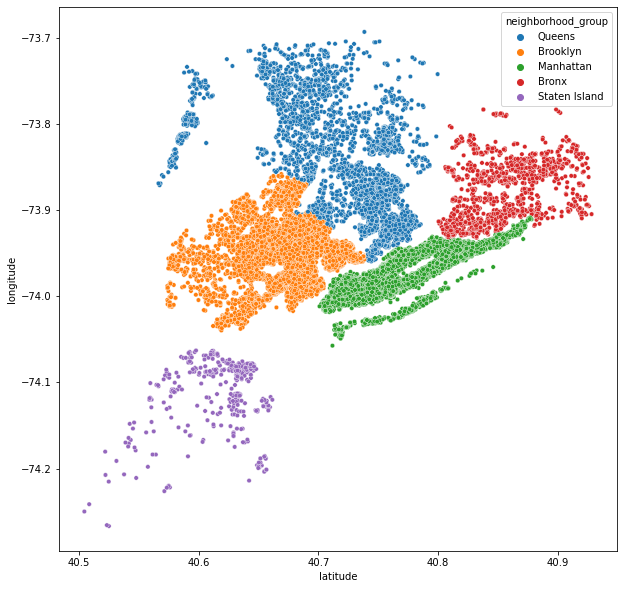

In [25]:
plt.figure(figsize=(10,10))
sns.scatterplot(x='latitude', y='longitude', s=20, hue = 'neighborhood_group', data=listings)
plt.show()

This is a nice plot, but we would like to see which parts of the city these listings are in (it would be even better if the map was interactive). We will want to create a GeoPandas DataFrame to store the `latitude` and `longitude` points of our listings, then we can plot them on the map!

In [26]:
# Using a list comprehension to combine our latitudes and longitudes
geometry = [Point(xy) for xy in zip(listings['longitude'], listings['latitude'])]
geometry[:1]

In [27]:
crs = {'init': 'epsg:4326'} # Standard for creating a GeoDataFrame

In [28]:
# Creating the geopandas dataframe
listings_geo = gpd.GeoDataFrame(listings,
                               crs = crs, 
                               geometry=geometry)

# Checking out our new type of dataframe, note the geometry column at the end
listings_geo.head()

/Users/williamsanzone/opt/anaconda3/envs/plotly_bokeh/lib/python3.8/site-packages/pyproj/crs/crs.py:130: FutureWarning:

'+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6



,id,listing_url,last_scraped,name,description,neighborhood_description,host_id,host_name,host_since,host_location,host_response_rate,host_acceptance_rate,host_is_superhost,host_neighbourhood,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,neighborhood,neighborhood_group,latitude,longitude,property_type,room_type,accommodates,num_bathrooms,bedrooms,beds,amenities,price,minimum_nights,maximum_nights,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,calculated_host_listings_count,reviews_per_month,host_has_bio,geometry
107238,639177088317762843,https://www.airbnb.com/rooms/639177088317762843,2022-06-04,.NEW ROOM - 1 STOP FROM MANHATTAN!!,Your family will be close to everything when y...,none,10932488,Mauricio,2013-12-31,"New York, New York, United States",1.00,0.84,1.0,Long Island City,0.0,"['email', 'phone']",1.0,1.0,Long Island City,Queens,40.748440,-73.948685,Private room in rental unit,Private room,2,1.0,1.0,2.0,"[""Essentials"", ""Bathtub"", ""Portable fans"", ""Ex...",160.0,1,10,1,11,28,56,331,2022-06-04,1,1,1,2022-06-02,2022-06-02,5.0,5.0,5.0,5.0,5.0,5.0,5.0,0,6,1.0,1,POINT (-73.94868 40.74844)
107237,638474663573735856,https://www.airbnb.com/rooms/638474663573735856,2022-06-04,Spacious private room and bathroom in New York,"A private master room in a cozy and spacious, ...","We are located in the lively Bleecker street, ...",15187068,Sara,2014-05-06,"New York, New York, United States",0.90,0.86,0.0,Bushwick,5.0,"['email', 'phone']",1.0,1.0,Bushwick,Brooklyn,40.698909,-73.918639,Private room in rental unit,Private room,2,1.0,1.0,1.0,"[""Wine glasses"", ""Conditioner"", ""Essentials"", ...",170.0,1,1125,1,17,45,45,45,2022-06-04,1,1,1,2022-06-02,2022-06-02,5.0,5.0,5.0,5.0,5.0,5.0,5.0,1,3,1.0,0,POINT (-73.91864 40.69891)
107236,637585491442944314,https://www.airbnb.com/rooms/637585491442944314,2022-06-04,Lovely & xtra large quiet bedroom in Prime Ast...,This extra large private bedroom is less than ...,none,459709498,Justin,2022-05-18,US,0.83,0.80,0.0,Long Island City,0.0,"['email', 'phone', 'work_email']",1.0,1.0,Long Island City,Queens,40.748006,-73.943495,Private room in serviced apartment,Private room,2,1.0,1.0,1.0,"[""Dryer"", ""Heating"", ""TV"", ""Smoke alarm"", ""Was...",74.0,1,5,1,1,1,1,35,2022-06-04,1,1,1,2022-06-02,2022-06-02,5.0,5.0,5.0,5.0,5.0,5.0,5.0,1,1,1.0,0,POINT (-73.94350 40.74801)
107235,635531827756587824,https://www.airbnb.com/rooms/635531827756587824,2022-06-04,DHNY RESIDENCE,Make some memories at this unique and family-f...,Very diverse community<br />Deli/ supermarket/...,398633876,Shadath,2021-04-25,"Queens, New York, United States",1.00,1.00,0.0,Jamaica,0.0,"['email', 'phone']",1.0,1.0,St. Albans,Queens,40.701603,-73.765610,Entire serviced apartment,Entire home/apt,6,1.0,3.0,3.0,"[""Conditioner"", ""Essentials"", ""Trash compactor...",189.0,1,365,1,11,41,71,346,2022-06-04,1,1,1,2022-05-30,2022-05-30,5.0,5.0,5.0,5.0,5.0,5.0,5.0,1,1,1.0,0,POINT (-73.76561 40.70160)
107234,635494783850320801,https://www.airbnb.com/rooms/635494783850320801,2022-06-03,Central Lovely 1-bedroom condo,You are close to everything when you stay at t...,none,384295125,Melissa,2021-01-12,"Austin, Texas, United States",0.92,0.52,0.0,Midtown,2.0,"['email', 'phone']",0.0,1.0,Midtown,Manhattan,40.765827,-73.982163,Entire condo,Entire home/apt,5,2.0,1.0,2.0,"[""Wine glasses"", ""Conditioner"", ""Essentials"", ...",550.0,1,365,1,19,47,77,352,2022-06-03,1,1,1,2022-05-31,2022-05-31,5.0,5.0,5.0,5.0,5.0,5.0,5.0,0,10,1.0,0,POINT (-73.98216 40.76583)


We will want to shrink down the columns of the GeoDataFrame so we can only get the information we want. These are the columns that will be displayed on our interactive map.

In [29]:
listings_geo_clean = listings_geo[['host_name', 'host_is_superhost', 'neighborhood', 'room_type', 'num_bathrooms',
                                  'bedrooms', 'beds', 'price', 'review_scores_rating', 'geometry', 'listing_url']]
listings_geo_clean = listings_geo_clean.sample(15000)

**Note:** Roughly half of the data was sampled for this plot. This is to help with the plot's slow runtime on the full dataset. If you would like to see the full dataset, comment out the above line of code.

-------

The GeoDataFrame has a cool method `.explore` which pulls up an interactive map through the folium package.

In [52]:
# Showing our interactive map
listing_map = listings_geo_clean.explore(cmap='coolwarm', column='price', tooltip=9, popup='listing_url')
listing_map

The below cell is to save our chart to a `html` file. 

In [53]:
#listing_map.save('plotly_charts/interactive_map.html')

This is quite the visualization, however we have included what should be the relevant information, when you click on each dot you can copy and paste the url into your browser to navigate to the listing on Airbnb's website.

Let's look at the number of listings for each borough in the city:

In [31]:
borough_totals = listings.neighborhood_group.value_counts().to_frame()

Displaying our aggregated data.

In [32]:
borough_totals.head()

,neighborhood_group
Manhattan,14836
Brooklyn,13965
Queens,5333
Bronx,1290
Staten Island,394


In [33]:
# Creating a chart using plotly
fig3 = px.bar(borough_totals,
             x=borough_totals.index,
             y='neighborhood_group',
             title='Count of Listings by Borough')

fig3.show() # Showing our chart

In [54]:
#fig3.write_html("plotly_charts/listings_by_borough.html")

**Interpretation:** We can see above that most listings are in Manhattan and Brooklyn, followed by Queens, the Bronx and Staten Island last. This makes sense as most people visiting the city usually spend their time in Manhattan or Brooklyn. It is surprising to see Queens in third place as this is not a part of the city that sees much tourism, but maybe that is changing.

------

Now let's look at the ratio of hosts who have their identity verified versus those who do not:

In [34]:
# creating a dataframe of the count of hosts who have verified their identity vs those who have not
verified = listings['host_identity_verified'].value_counts().to_frame()
verified

,host_identity_verified
1.0,30565
0.0,5253


In [35]:
# Creating our figure using plotly
fig4 = px.bar(verified,
             x=verified.index,
             y='host_identity_verified',
             title='Breakdown of Hosts Who have Verified Identity Versus Those That do Not')
fig4.show()

In [55]:
#fig4.write_html("plotly_charts/host_identity_verified.html")

**Interpretation:** A large majority of hosts have verified their identity on the Airbnb website. This makes sense as hosts who want people to stay with them are more likely to verify their identity than not. It is surprising to see that over 5,000 hosts have not verified their identity though.

Let's look at the distribution of property types throughout our dataset:

In [36]:
# aggregating a new dataframe for counts of listings by property type
property_types = listings['property_type'].value_counts()[:10].to_frame()
property_types

,property_type
Entire rental unit,15511
Private room in rental unit,9844
Private room in home,1570
Entire home,1144
Entire condo,1010
Private room in townhouse,938
Entire loft,705
Room in hotel,634
Entire townhouse,609
Private room in residential home,422


In [37]:
# Charting our dataframe that was just made
fig5 = px.bar(property_types,
             x=property_types.index,
             y='property_type',
             title='Distribution of Host Property Types')

fig5.show()

In [56]:
#fig5.write_html("plotly_charts/property_type_distribution.html")

**Interpretation:** Most listings are either an entire rental unit (apartment) or a private room in a rental unit. This makes sense as NYC is pretty dense population-wise and most people live in apartments. It is surprising to see that private rooms in someone's homes make up a lot of the listings though. It is also important to note the steep drop off in the number of listings after `Private room in rental unit`. We would have expected to see more condos and townhomes in the dataset.

------

Let's look at the distribution of room types in the dataset as well.

In [38]:
# Creating a dataframe of the various room types in the dataset
room_types = listings['room_type'].value_counts().to_frame()
room_types

,room_type
Entire home/apt,20271
Private room,14843
Shared room,519
Hotel room,185


In [39]:
# Creating our plotly chart
fig6 = px.bar(room_types,
             x=room_types.index,
             y='room_type',
             title='Distribution of Room Types in the Dataset')

fig6.show()

In [57]:
#fig6.write_html("plotly_charts/room_type_distribution.html")

**Interpretation:** Similar to above, most rooms are either an entire home/apartment or a private room within a home. It is surprising to see "Hotel room" as a category, as most people would likely book a hotel room through some other service than Airbnb. The Entire home/apt and private room categories do make up more than 90% of the listings as well.

Let's look at the room types again, but now we will look at the room type distribution for each Borough.

In [40]:
# Creating our aggregated dataframe
room_types_boroughs = listings.groupby(by=['room_type', 'neighborhood_group']).size().to_frame()
room_types_boroughs.reset_index(inplace=True) # resetting the index
room_types_boroughs # showing the dataframe

,room_type,neighborhood_group,0
0,Entire home/apt,Bronx,585
1,Entire home/apt,Brooklyn,7805
2,Entire home/apt,Manhattan,9256
3,Entire home/apt,Queens,2394
4,Entire home/apt,Staten Island,231
5,Hotel room,Brooklyn,9
6,Hotel room,Manhattan,168
7,Hotel room,Queens,8
8,Private room,Bronx,678
9,Private room,Brooklyn,5978


We will rename the columns to make it a bit easier to understand.

In [41]:
# Renaming the columns
room_types_boroughs.rename(columns={'room_type': 'room_type', 
                                    'neighborhood_group': 'borough', 0: 'count'}, inplace=True)

# Checking to make sure that it has worked
room_types_boroughs

,room_type,borough,count
0,Entire home/apt,Bronx,585
1,Entire home/apt,Brooklyn,7805
2,Entire home/apt,Manhattan,9256
3,Entire home/apt,Queens,2394
4,Entire home/apt,Staten Island,231
5,Hotel room,Brooklyn,9
6,Hotel room,Manhattan,168
7,Hotel room,Queens,8
8,Private room,Bronx,678
9,Private room,Brooklyn,5978


In [42]:
# Plotting the above dataframe
fig7 = px.bar(room_types_boroughs,
             x='borough',
             y='count',
             color='room_type',
             title='Room Types by Borough for NYC')

fig7.show()

In [59]:
#fig7.write_html("plotly_charts/room_type_by_borough.html")

**Interpretation:** Here are some insights from the above chart:

1. The only hotel rooms in the dataset are in Manhattan
2. Both the Bronx and Staten Island don't have any shared rooms in their listings
3. The most shared rooms are in Manhattan with 221 listings
4. The Bronx has almost an equal amount of listings that are private rooms vs listings that are entire homes or apartments

Now let's look at the relationship between a few numerical variables. We will start with the relationship between a hosts number of reviews and their review scores.

In [58]:
# Taking a look at our dataframe again
listings.head()

,id,listing_url,last_scraped,name,description,neighborhood_description,host_id,host_name,host_since,host_location,host_response_rate,host_acceptance_rate,host_is_superhost,host_neighbourhood,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,neighborhood,neighborhood_group,latitude,longitude,property_type,room_type,accommodates,num_bathrooms,bedrooms,beds,amenities,price,minimum_nights,maximum_nights,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,calculated_host_listings_count,reviews_per_month,host_has_bio,geometry
107238,639177088317762843,https://www.airbnb.com/rooms/639177088317762843,2022-06-04,.NEW ROOM - 1 STOP FROM MANHATTAN!!,Your family will be close to everything when y...,none,10932488,Mauricio,2013-12-31,"New York, New York, United States",1.00,0.84,1.0,Long Island City,0.0,"['email', 'phone']",1.0,1.0,Long Island City,Queens,40.748440,-73.948685,Private room in rental unit,Private room,2,1.0,1.0,2.0,"[""Essentials"", ""Bathtub"", ""Portable fans"", ""Ex...",160.0,1,10,1,11,28,56,331,2022-06-04,1,1,1,2022-06-02,2022-06-02,5.0,5.0,5.0,5.0,5.0,5.0,5.0,0,6,1.0,1,POINT (-73.94868 40.74844)
107237,638474663573735856,https://www.airbnb.com/rooms/638474663573735856,2022-06-04,Spacious private room and bathroom in New York,"A private master room in a cozy and spacious, ...","We are located in the lively Bleecker street, ...",15187068,Sara,2014-05-06,"New York, New York, United States",0.90,0.86,0.0,Bushwick,5.0,"['email', 'phone']",1.0,1.0,Bushwick,Brooklyn,40.698909,-73.918639,Private room in rental unit,Private room,2,1.0,1.0,1.0,"[""Wine glasses"", ""Conditioner"", ""Essentials"", ...",170.0,1,1125,1,17,45,45,45,2022-06-04,1,1,1,2022-06-02,2022-06-02,5.0,5.0,5.0,5.0,5.0,5.0,5.0,1,3,1.0,0,POINT (-73.91864 40.69891)
107236,637585491442944314,https://www.airbnb.com/rooms/637585491442944314,2022-06-04,Lovely & xtra large quiet bedroom in Prime Ast...,This extra large private bedroom is less than ...,none,459709498,Justin,2022-05-18,US,0.83,0.80,0.0,Long Island City,0.0,"['email', 'phone', 'work_email']",1.0,1.0,Long Island City,Queens,40.748006,-73.943495,Private room in serviced apartment,Private room,2,1.0,1.0,1.0,"[""Dryer"", ""Heating"", ""TV"", ""Smoke alarm"", ""Was...",74.0,1,5,1,1,1,1,35,2022-06-04,1,1,1,2022-06-02,2022-06-02,5.0,5.0,5.0,5.0,5.0,5.0,5.0,1,1,1.0,0,POINT (-73.94350 40.74801)
107235,635531827756587824,https://www.airbnb.com/rooms/635531827756587824,2022-06-04,DHNY RESIDENCE,Make some memories at this unique and family-f...,Very diverse community<br />Deli/ supermarket/...,398633876,Shadath,2021-04-25,"Queens, New York, United States",1.00,1.00,0.0,Jamaica,0.0,"['email', 'phone']",1.0,1.0,St. Albans,Queens,40.701603,-73.765610,Entire serviced apartment,Entire home/apt,6,1.0,3.0,3.0,"[""Conditioner"", ""Essentials"", ""Trash compactor...",189.0,1,365,1,11,41,71,346,2022-06-04,1,1,1,2022-05-30,2022-05-30,5.0,5.0,5.0,5.0,5.0,5.0,5.0,1,1,1.0,0,POINT (-73.76561 40.70160)
107234,635494783850320801,https://www.airbnb.com/rooms/635494783850320801,2022-06-03,Central Lovely 1-bedroom condo,You are close to everything when you stay at t...,none,384295125,Melissa,2021-01-12,"Austin, Texas, United States",0.92,0.52,0.0,Midtown,2.0,"['email', 'phone']",0.0,1.0,Midtown,Manhattan,40.765827,-73.982163,Entire condo,Entire home/apt,5,2.0,1.0,2.0,"[""Wine glasses"", ""Conditioner"", ""Essentials"", ...",550.0,1,365,1,19,47,77,352,2022-06-03,1,1,1,2022-05-31,2022-05-31,5.0,5.0,5.0,5.0,5.0,5.0,5.0,0,10,1.0,0,POINT (-73.98216 40.76583)


In [44]:
# Creating a scatter plot for number of reviews vs a host's review score
fig8 = px.scatter(listings,
                 x='number_of_reviews',
                 y = 'review_scores_rating',
                 opacity = 0.3,
                 range_x = [0, 600],
                 range_y=[1,6],
                 title='Relationship Between Number of Reviews and A Hosts Rating Score')

fig8.show()

In [60]:
#fig8.write_html("plotly_charts/num_reviews_vs_review_scores_rating.html")

**Interpretation:** This is an interesting distribution, since our data is highly imbalanced towards hosts with 5 star ratings there are a lot of data points around y=5. What's interesting is the density of the datapoints between 0 reviews and 200 reviews. There are a large amount of data points here, and this relationship is not the linear relationship we expected.

-----

Let's see what other relationships we can explore:

In [45]:
# Re-looking at our dataframe
listings

,id,listing_url,last_scraped,name,description,neighborhood_description,host_id,host_name,host_since,host_location,host_response_rate,host_acceptance_rate,host_is_superhost,host_neighbourhood,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,neighborhood,neighborhood_group,latitude,longitude,property_type,room_type,accommodates,num_bathrooms,bedrooms,beds,amenities,price,minimum_nights,maximum_nights,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,calculated_host_listings_count,reviews_per_month,host_has_bio,geometry
107238,639177088317762843,https://www.airbnb.com/rooms/639177088317762843,2022-06-04,.NEW ROOM - 1 STOP FROM MANHATTAN!!,Your family will be close to everything when y...,none,10932488,Mauricio,2013-12-31,"New York, New York, United States",1.00,0.84,1.0,Long Island City,0.0,"['email', 'phone']",1.0,1.0,Long Island City,Queens,40.748440,-73.948685,Private room in rental unit,Private room,2,1.0,1.0,2.0,"[""Essentials"", ""Bathtub"", ""Portable fans"", ""Ex...",160.0,1,10,1,11,28,56,331,2022-06-04,1,1,1,2022-06-02,2022-06-02,5.00,5.00,5.00,5.00,5.00,5.00,5.00,0,6,1.00,1,POINT (-73.94868 40.74844)
107237,638474663573735856,https://www.airbnb.com/rooms/638474663573735856,2022-06-04,Spacious private room and bathroom in New York,"A private master room in a cozy and spacious, ...","We are located in the lively Bleecker street, ...",15187068,Sara,2014-05-06,"New York, New York, United States",0.90,0.86,0.0,Bushwick,5.0,"['email', 'phone']",1.0,1.0,Bushwick,Brooklyn,40.698909,-73.918639,Private room in rental unit,Private room,2,1.0,1.0,1.0,"[""Wine glasses"", ""Conditioner"", ""Essentials"", ...",170.0,1,1125,1,17,45,45,45,2022-06-04,1,1,1,2022-06-02,2022-06-02,5.00,5.00,5.00,5.00,5.00,5.00,5.00,1,3,1.00,0,POINT (-73.91864 40.69891)
107236,637585491442944314,https://www.airbnb.com/rooms/637585491442944314,2022-06-04,Lovely & xtra large quiet bedroom in Prime Ast...,This extra large private bedroom is less than ...,none,459709498,Justin,2022-05-18,US,0.83,0.80,0.0,Long Island City,0.0,"['email', 'phone', 'work_email']",1.0,1.0,Long Island City,Queens,40.748006,-73.943495,Private room in serviced apartment,Private room,2,1.0,1.0,1.0,"[""Dryer"", ""Heating"", ""TV"", ""Smoke alarm"", ""Was...",74.0,1,5,1,1,1,1,35,2022-06-04,1,1,1,2022-06-02,2022-06-02,5.00,5.00,5.00,5.00,5.00,5.00,5.00,1,1,1.00,0,POINT (-73.94350 40.74801)
107235,635531827756587824,https://www.airbnb.com/rooms/635531827756587824,2022-06-04,DHNY RESIDENCE,Make some memories at this unique and family-f...,Very diverse community<br />Deli/ supermarket/...,398633876,Shadath,2021-04-25,"Queens, New York, United States",1.00,1.00,0.0,Jamaica,0.0,"['email', 'phone']",1.0,1.0,St. Albans,Queens,40.701603,-73.765610,Entire serviced apartment,Entire home/apt,6,1.0,3.0,3.0,"[""Conditioner"", ""Essentials"", ""Trash compactor...",189.0,1,365,1,11,41,71,346,2022-06-04,1,1,1,2022-05-30,2022-05-30,5.00,5.00,5.00,5.00,5.00,5.00,5.00,1,1,1.00,0,POINT (-73.76561 40.70160)
107234,635494783850320801,https://www.airbnb.com/rooms/635494783850320801,2022-06-03,Central Lovely 1-bedroom condo,You are close to everything when you stay at t...,none,384295125,Melissa,2021-01-12,"Austin, Texas, United States",0.92,0.52,0.0,Midtown,2.0,"['email', 'phone']",0.0,1.0,Midtown,Manhattan,40.765827,-73.982163,Entire condo,Entire home/apt,5,2.0,1.0,2.0,"[""Wine glasses"", ""Conditioner"", ""Essentials"", ...",550.0,1,365,1,19,47,77,352,2022-06-03,1,1,1,2022-05-31,2022-05-31,5.00,5.00,5.00,5.00,5.00,5.00,5.00,0,10,1.00,0,POINT (-73.98216 40.76583)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...

Let's look at the relationship between a host's review score and the price that they charge for their listing:

In [46]:
# Creating scatter plot for review score vs the host's listing price
fig9 = px.scatter(listings,
                 x='review_scores_rating',
                 y = 'price',
                 opacity = 0.5,
                 title='Relationship Between Hosts Review Score and Price Charged')

fig9.show()

In [61]:
#fig9.write_html("plotly_charts/review_score_vs_price.html")

**Interpretation:** Here we see somewhat of a linear trend. Hosts with higher review scores are typically charging more, aside from some outliers in the data. It is important to note the two datapoints at a review score of around three. These hosts have lower review scores, but are still charging upwards of $9,000 per night for their listings! Most of the datapoints though are clustered between a review score of 3 & 5 and a price below 2,000 a night.

--------------------------

Let's take a closer look at the distribution of the `price` column.

In [47]:
# Histogram of the price column
fig10 = px.histogram(listings, 
                    x='price',
                    range_x = [0,3000],
                    nbins=600,
                    title='Distribution of Review Price')
fig10.show()

In [62]:
#fig10.write_html("plotly_charts/price_histogram.html")

**Interpretation:** We can see that the `price` parameter is highly right-skewed. The most frequent bin in the histogram is listings with prices between 60 dollars and 79 dollars with a count 4,723. This distribution trails off as the price increases. It is interesting to note that there are 1,128 listings with prices between 20 dollars and 39 dollars per night.

------ 

Let's see what variables are related with a heatmap:

In [48]:
listings_clean = listings.select_dtypes(['int', 'float', 'bool'])
listings_clean.shape

(35818, 36)

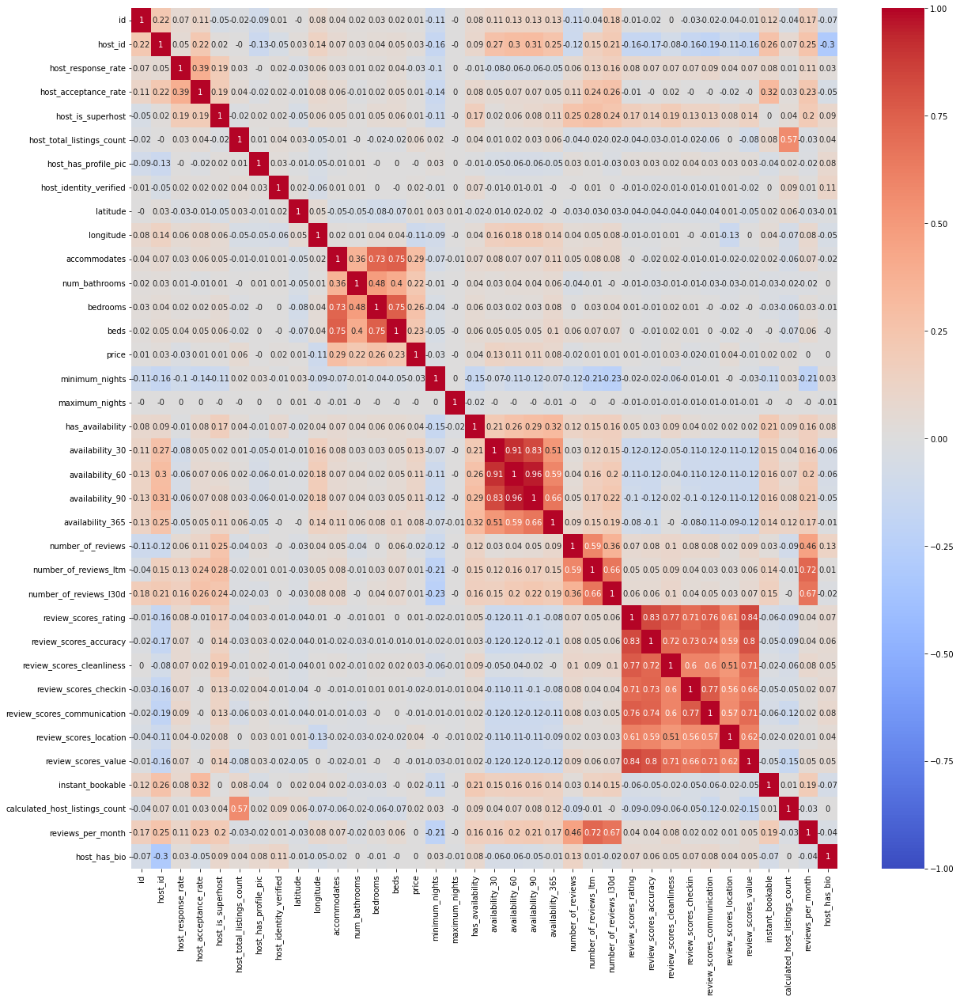

In [49]:
plt.figure(figsize=(20,20))
sns.heatmap(listings_clean.corr().round(2), vmin=-1, vmax=1, cmap='coolwarm', annot=True)
plt.show()

**Interpretation:** Due to the high number of features in the dataset, this heat map is pretty big. There are some important relationships to note however:

1. A lot of the variables starting with `review_scores` are correlated with each other. This makes sense as a person's review score on checkin should be related to their overall review score
    - These features (besides `review_scores_rating`) will be removed in the encoding step of the project to avoid skewing the results of the models
    
    
2. `host_has_bio` and `host_id` are negatively correlated
3. `beds`, `bedrooms` and `accommodates` have a strong positive correlation which is to be expected
4. There is somewhat of a positive correlation between `instant_bookable` and `host_acceptance_rate`

In [63]:
listings.head()

,id,listing_url,last_scraped,name,description,neighborhood_description,host_id,host_name,host_since,host_location,host_response_rate,host_acceptance_rate,host_is_superhost,host_neighbourhood,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,neighborhood,neighborhood_group,latitude,longitude,property_type,room_type,accommodates,num_bathrooms,bedrooms,beds,amenities,price,minimum_nights,maximum_nights,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,calculated_host_listings_count,reviews_per_month,host_has_bio,geometry
107238,639177088317762843,https://www.airbnb.com/rooms/639177088317762843,2022-06-04,.NEW ROOM - 1 STOP FROM MANHATTAN!!,Your family will be close to everything when y...,none,10932488,Mauricio,2013-12-31,"New York, New York, United States",1.00,0.84,1.0,Long Island City,0.0,"['email', 'phone']",1.0,1.0,Long Island City,Queens,40.748440,-73.948685,Private room in rental unit,Private room,2,1.0,1.0,2.0,"[""Essentials"", ""Bathtub"", ""Portable fans"", ""Ex...",160.0,1,10,1,11,28,56,331,2022-06-04,1,1,1,2022-06-02,2022-06-02,5.0,5.0,5.0,5.0,5.0,5.0,5.0,0,6,1.0,1,POINT (-73.94868 40.74844)
107237,638474663573735856,https://www.airbnb.com/rooms/638474663573735856,2022-06-04,Spacious private room and bathroom in New York,"A private master room in a cozy and spacious, ...","We are located in the lively Bleecker street, ...",15187068,Sara,2014-05-06,"New York, New York, United States",0.90,0.86,0.0,Bushwick,5.0,"['email', 'phone']",1.0,1.0,Bushwick,Brooklyn,40.698909,-73.918639,Private room in rental unit,Private room,2,1.0,1.0,1.0,"[""Wine glasses"", ""Conditioner"", ""Essentials"", ...",170.0,1,1125,1,17,45,45,45,2022-06-04,1,1,1,2022-06-02,2022-06-02,5.0,5.0,5.0,5.0,5.0,5.0,5.0,1,3,1.0,0,POINT (-73.91864 40.69891)
107236,637585491442944314,https://www.airbnb.com/rooms/637585491442944314,2022-06-04,Lovely & xtra large quiet bedroom in Prime Ast...,This extra large private bedroom is less than ...,none,459709498,Justin,2022-05-18,US,0.83,0.80,0.0,Long Island City,0.0,"['email', 'phone', 'work_email']",1.0,1.0,Long Island City,Queens,40.748006,-73.943495,Private room in serviced apartment,Private room,2,1.0,1.0,1.0,"[""Dryer"", ""Heating"", ""TV"", ""Smoke alarm"", ""Was...",74.0,1,5,1,1,1,1,35,2022-06-04,1,1,1,2022-06-02,2022-06-02,5.0,5.0,5.0,5.0,5.0,5.0,5.0,1,1,1.0,0,POINT (-73.94350 40.74801)
107235,635531827756587824,https://www.airbnb.com/rooms/635531827756587824,2022-06-04,DHNY RESIDENCE,Make some memories at this unique and family-f...,Very diverse community<br />Deli/ supermarket/...,398633876,Shadath,2021-04-25,"Queens, New York, United States",1.00,1.00,0.0,Jamaica,0.0,"['email', 'phone']",1.0,1.0,St. Albans,Queens,40.701603,-73.765610,Entire serviced apartment,Entire home/apt,6,1.0,3.0,3.0,"[""Conditioner"", ""Essentials"", ""Trash compactor...",189.0,1,365,1,11,41,71,346,2022-06-04,1,1,1,2022-05-30,2022-05-30,5.0,5.0,5.0,5.0,5.0,5.0,5.0,1,1,1.0,0,POINT (-73.76561 40.70160)
107234,635494783850320801,https://www.airbnb.com/rooms/635494783850320801,2022-06-03,Central Lovely 1-bedroom condo,You are close to everything when you stay at t...,none,384295125,Melissa,2021-01-12,"Austin, Texas, United States",0.92,0.52,0.0,Midtown,2.0,"['email', 'phone']",0.0,1.0,Midtown,Manhattan,40.765827,-73.982163,Entire condo,Entire home/apt,5,2.0,1.0,2.0,"[""Wine glasses"", ""Conditioner"", ""Essentials"", ...",550.0,1,365,1,19,47,77,352,2022-06-03,1,1,1,2022-05-31,2022-05-31,5.0,5.0,5.0,5.0,5.0,5.0,5.0,0,10,1.0,0,POINT (-73.98216 40.76583)


Let's look at the relationship between `room_type` and `price` as a boxplot. **Note:** There are a few outliers in this data so to make the chart more readable, we have limited the `price` column to listings with a price below 1,200 dollars a night.

In [80]:
# Creating scatter plot for review score vs the host's listing price
fig11 = px.box(listings[listings['price'] <= 1200],
                 x='room_type',
                 y = 'price',
                 title='Boxplot of Room Types and Price Charged')

fig11.show()

In [81]:
#fig11.write_html("plotly_charts/price_vs_roomtype_boxplot.html")

**Interpretation:** It is interesting to see that the median price for a Hotel room is the highest amongst the dataset. We would have assumed that an entire home or apartment would have the highest median price. There are a lot of outliers in this data with Private rooms and Entire homes/apartments having the most outliers. Hotel rooms also have the largest interquartile range and the largest fence (or the difference between the minimum value and the value of the "upper fence."

## Conclusion

In this notebook we have done some exploratory data analysis on the NYC data. Here are some of the insights gathered from this analysis:

- Most listings are in Manhattan and Brooklyn
- Most hosts have a review score between 4 and 5, making the data highly imbalanced
- A large majority of hosts have their identities verified
- The only hotel rooms in the dataset are in Manhattan
- The relationship between number of reviews and review score is not linear like expected
- In general, hosts with higher review scores tend to charge more for their listings. This is not true across the board as there are plenty of outliers in the data
- The distribution of the listing prices is highly right-skewed, with most listings costing below 500 dollars per night
- We explored the correlations between all the features in the dataset, and didn't find anything terribly unexpected
- Hotel rooms have the highest median price charged per night, which was unexpected and went agaist our assumptions

## Next Steps:

- The next notebook for this project is the Encoding and Pre-processing notebook where the data is further processed for the machine learning models

Finally, we want to export our `listings` dataframe to a `.csv` file that will then be fed into the Encoding and Pre-processing notebook.

In [50]:
# saving our dataframe as a csv file
listings.to_csv('final_listings.csv')